In [1]:
]activate ../../../../

  Activating project at `~/UCLOneDrive/SpatialStructureInMicrobialCommunities/SSMCCode`

In [2]:
using Revise
includet("./base.jl")

In [3]:
using CairoMakie
CairoMakie.activate!()
using Statistics, ColorSchemes

# Load

40 PDE runs of `systems.jld2` - 20 SI systems x p in {0.1, 1} - written into `data` by `main1()`. Writes five pdfs into `figures/`: `final_states.pdf`, `final_states_zoom.pdf`, `spacetime_biomass.pdf`, `biomass_in_time_rel.pdf`, `biomass_in_time_rel_all.pdf`.

In [4]:
datadir = "data"
figdir = "figures"
mkpath(figdir)

setup = load("systems.jld2")
pde_df = setup["pde_df"]
smeta = setup["metadata"]

runs = collect_pde_runs(datadir)
runs.params = [pde_df.params[i] for i in runs.pde_df_row]
runs.hss = [pde_df.ode_hss[i] for i in runs.pde_df_row]  # reduced well-mixed steady state
runs.Ns = [get_Ns(p)[1] for p in runs.params]            # varies per system after reduce_extinct
runs.Nr = [get_Ns(p)[2] for p in runs.params]
runs.B_hss = [sum(h[1:ns]) for (h, ns) in zip(runs.hss, runs.Ns)]  # well-mixed total strain biomass

pvals = smeta.ps
sys = sort(unique(runs.gdf_row))
np, nsys = length(pvals), length(sys)
T = runs.T[1]

@assert all(length.(runs.hss) .== runs.Ns .+ runs.Nr)

@printf("%d/%d rows present, missing %s\n", nrow(runs), nrow(pde_df),
    string(setdiff(1:nrow(pde_df), runs.pde_df_row)))
for rc in sort(unique(string.(runs.retcode)))
    @printf("retcode %s: %d\n", rc, count(==(rc), string.(runs.retcode)))
end
@printf("saved states per run: %d - %d,  worst residual %.3g,  wall clock %.2g - %.2g h\n",
    minimum(runs.num_saved), maximum(runs.num_saved), maximum(runs.maxresid),
    minimum(runs.realtime) / 3600, maximum(runs.realtime) / 3600)

select(runs, Not(:final_state, :params, :hss))

40/40 rows present, missing Int64[]
retcode MaxTime: 1retcode Success: 39
saved states per run: 31 - 3603,  worst residual 8.28e-05,  wall clock 0.057 - 3 h

Row,pde_df_row,gdf_row,df_row,p,L,sN,T,retcode,final_T,maxresid,num_saved,realtime,Ns,Nr,B_hss
,Int64,Int64,Int64,Float64,Float64,Int64,Float64,T,Float64,Float64,Int64,Float64,Int64,Int64,Float64
1,1,1,4539,0.1,40.5477,2000,1.0e8,Success,1.0e8,1.90425e-12,34,330.756,3,16,4.49264
2,2,1,4539,1.0,52.0215,2000,1.0e8,Success,1.0e8,2.28235e-7,177,1288.47,3,16,4.49264
3,3,2,3208,0.1,41.686,2000,1.0e8,Success,1.0e8,4.06395e-11,41,482.078,6,18,4.56514
4,4,2,3208,1.0,54.9833,2000,1.0e8,Success,1.0e8,7.83238e-8,181,1481.96,6,18,4.56514
5,5,3,12,0.1,58.1138,2000,1.0e8,Success,1.0e8,2.84341e-11,35,307.274,5,16,2.86737
6,6,3,12,1.0,85.628,2000,1.0e8,Success,1.0e8,5.83377e-9,252,1573.56,5,16,2.86737
7,7,4,356,0.1,63.1468,2000,1.0e8,Success,1.0e8,1.46017e-12,36,405.502,4,16,2.39366
8,8,4,356,1.0,98.3413,2000,1.0e8,Success,1.0e8,1.53055e-8,318,1918.32,4,16,2.39366
9,9,5,2255,0.1,41.686,2000,1.0e8,Success,1.0e8,1.89271e-12,39,206.306,2,9,3.95287


In [5]:
# panel grid: one row per system, one column per p
panel_pos(r) = (findfirst(==(r.gdf_row), sys), findfirst(p -> isapprox(p, r.p), pvals))

short_title(r) = @sprintf("sys %d (df %d), p = %g, L = %.4g", r.gdf_row, r.df_row, r.p, r.L) *
                 (r.retcode == ReturnCode.Success ? "" :
                  @sprintf("\n%s at t = %.3g", string(r.retcode), r.final_T))
suptitle = @sprintf("K = %g, l = %g, DN = %g, DI = %g, sN = %d, %d peaks per domain, T = %.3g",
    smeta.K, smeta.l, smeta.DN, smeta.DI, smeta.sN, smeta.num_peaks, T)

xs_of(r) = ((1:r.sN) .- 0.5) ./ r.sN   # x / L, since L differs between runs

# the t window the space-time and biomass panels are drawn over. The solver saves
# a couple of states at t ~ 1e-17, so without a floor 20 empty decades take up
# most of a log axis.
trange = (1e0, T)

pcolors = Makie.resample_cmap(:viridis, max(np, 2))
suptitle

"K = 10, l = 0.999, DN = 0.001, DI = 1, sN = 2000, 30 peaks per domain, T = 1e+08"

# Reduced series

One pass over the saved states (~3GB on disk), keeping only `B(t, x)`, the total strain biomass at each gridpoint and saved time.

In [6]:
series = Dict(@showprogress map(eachrow(runs)) do r
    (; ts, us) = load_pde_states(datadir, r.pde_df_row)
    keep = findall(>(0.0), ts)   # t = 0 has no place on a log axis
    ntot = permutedims(reduce(hcat, [vec(sum(view(u, 1:r.Ns, :); dims=1)) for u in us[keep]]))
    GC.gc()
    r.pde_df_row => (; ts=ts[keep], ntot)
end)

# spatial mean of the total strain biomass in time; mean not integral, since L differs between runs
runs.Bmean = [vec(mean(series[r].ntot; dims=2)) for r in runs.pde_df_row]
runs.ts = [series[r].ts for r in runs.pde_df_row]

extrema(length.(runs.ts))

Progress: 100%|█████████████████████████████████████████| Time: 0:00:39

(30, 3602)

# 1. Final states

One panel per run, circularly shifted so the biomass peak sits in the middle. Strains on top with their total in black, resources below, dashed lines the well-mixed steady state.

In [7]:
"""
    plot_final_state!(where, r; title, xfrac, hidex)

Final state of one run, circularly shifted so the total biomass peak is centred
and cropped to the middle `xfrac` of the domain. Strains on top with their total
in black, resources below, dashed lines the well-mixed steady state. Cropping
drops the gridpoints outside the window rather than clipping them, which is also
what keeps the pdf small.
"""
function plot_final_state!(where, r; title="", xfrac=1.0, hidex=false)
    ns, nr = r.Ns, r.Nr   # per system, after reduce_extinct
    scolors = Makie.resample_cmap(:viridis, max(ns, 2))
    rcolors = Makie.resample_cmap(:plasma, max(nr, 2))

    u = r.final_state
    n = size(u, 2)
    B = vec(sum(view(u, 1:ns, :); dims=1))
    uc = circshift(u, (0, div(n, 2) - argmax(B)))
    nsub = clamp(round(Int, xfrac * n), 2, n)
    i0 = div(n - nsub, 2) + 1
    idxs = i0:(i0+nsub-1)
    xs = (idxs .- 0.5) .* (r.L / n)

    gl = GridLayout(where)
    axs = Axis(gl[1, 1]; ylabel="strains", title, titlesize=10)
    axr = Axis(gl[2, 1]; ylabel="resources", xlabel="x")
    linkxaxes!(axs, axr)
    hidexdecorations!(axs; grid=false)
    hidex && hidexdecorations!(axr; grid=false)
    rowgap!(gl, 4)

    for i in 1:ns
        lines!(axs, xs, uc[i, idxs]; color=scolors[i], linewidth=0.7)
        hlines!(axs, r.hss[i]; color=scolors[i], linestyle=:dash, linewidth=0.4)
    end
    lines!(axs, xs, vec(sum(view(uc, 1:ns, idxs); dims=1)); color=:black, linewidth=1.6)
    hlines!(axs, r.B_hss; color=:black, linestyle=:dash, linewidth=1.0)
    for a in 1:nr
        lines!(axr, xs, uc[ns+a, idxs]; color=rcolors[a], linewidth=0.7)
        hlines!(axr, r.hss[ns+a]; color=rcolors[a], linestyle=:dash, linewidth=0.4)
    end
    xlims!(axs, extrema(xs))

    axs, axr
end

"""
    final_states_fig(; xfrac)

The final state panel grid: one row per system, one column per p.
"""
function final_states_fig(; xfrac=1.0)
    fig = Figure(; size=(520 * np, 380 * nsys))
    Label(fig[0, 1:np], suptitle; fontsize=16, tellwidth=false)
    for r in eachrow(runs)
        i, j = panel_pos(r)
        plot_final_state!(fig[i, j], r; title=short_title(r), xfrac, hidex=(i != nsys))
    end
    rowgap!(fig.layout, 16)
    fig
end

Makie.save(joinpath(figdir, "final_states.pdf"), final_states_fig())

CairoMakie.Screen{PDF}


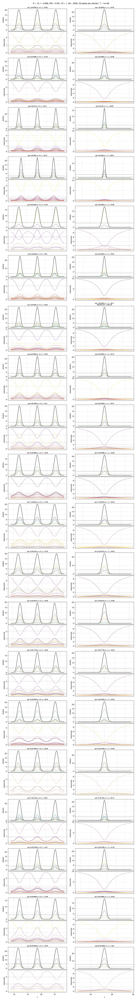

In [8]:
# the middle tenth of each domain, ie 3 of the 30 peaks
fig = final_states_fig(; xfrac=0.1)
Makie.save(joinpath(figdir, "final_states_zoom.pdf"), fig)
fig

# 2. Space-time, total strain biomass

`B(t, x)` over the well-mixed total of the same system, so every panel shares one log colour scale. Values are clamped at `blo` so the empty troughs stay on scale.

In [9]:
"""
    log_edges(ts)

Cell edges for a heatmap on a log time axis. Makie extrapolates half a cell past
each end, which on these solver time grids lands at or below zero and makes log10
throw; bisecting in log space instead keeps every edge positive.
"""
function log_edges(ts)
    lt = log10.(ts)
    mid = (lt[1:end-1] .+ lt[2:end]) ./ 2
    10 .^ vcat(2 * lt[1] - mid[1], mid, 2 * lt[end] - mid[end])
end

"""
    window(s, trange)

The saved states of `s` inside `trange` as `(; keep, edges)`. The first cell is
stretched back to the start of the window - before it the state is still the
untouched initial condition - but the last edge is pinned to the last saved t, so
a run that stopped early stops early on the plot instead of smearing its final
state over the decades it never reached.
"""
function window(s, trange)
    keep = findall(t -> trange[1] <= t <= trange[2], s.ts)
    edges = log_edges(s.ts[keep])
    edges[1] = trange[1]
    edges[end] = s.ts[keep[end]]
    (; keep, edges)
end

blo = 1e-2   # clamp, in units of the well-mixed total
bhi = maximum(maximum(series[r.pde_df_row].ntot) / r.B_hss for r in eachrow(runs))

"""
    spacetime_fig()

`B(t, x)` over the well-mixed total, one panel per run on a shared log colour
scale.
"""
function spacetime_fig()
    fig = Figure(; size=(460 * np + 80, 320 * nsys))
    Label(fig[0, 1:np], suptitle; fontsize=16, tellwidth=false)
    hm = nothing

    for r in eachrow(runs)
        i, j = panel_pos(r)
        ax = Axis(fig[i, j]; xscale=log10, title=short_title(r), titlesize=12,
            xlabel=(i == nsys ? "t" : ""), ylabel=(j == 1 ? "x / L" : ""))

        s = series[r.pde_df_row]
        (; keep, edges) = window(s, trange)
        hm = heatmap!(ax, edges, xs_of(r), max.(s.ntot[keep, :] ./ r.B_hss, blo);
            colormap=:viridis, colorscale=log10, colorrange=(blo, bhi), rasterize=2)
        xlims!(ax, trange...)
    end
    # off the heatmap itself rather than by attribute, so the colorbar cannot
    # disagree with the panels about the scale
    Colorbar(fig[1:nsys, np+1], hm; label="sum of strains / well-mixed total")
    rowgap!(fig.layout, 16)
    fig
end

Makie.save(joinpath(figdir, "spacetime_biomass.pdf"), spacetime_fig())

CairoMakie.Screen{PDF}


# 3. Total biomass in time, relative to the well-mixed steady state

Spatial mean of the total strain biomass over that system's well-mixed total, one panel per system and one line per p.

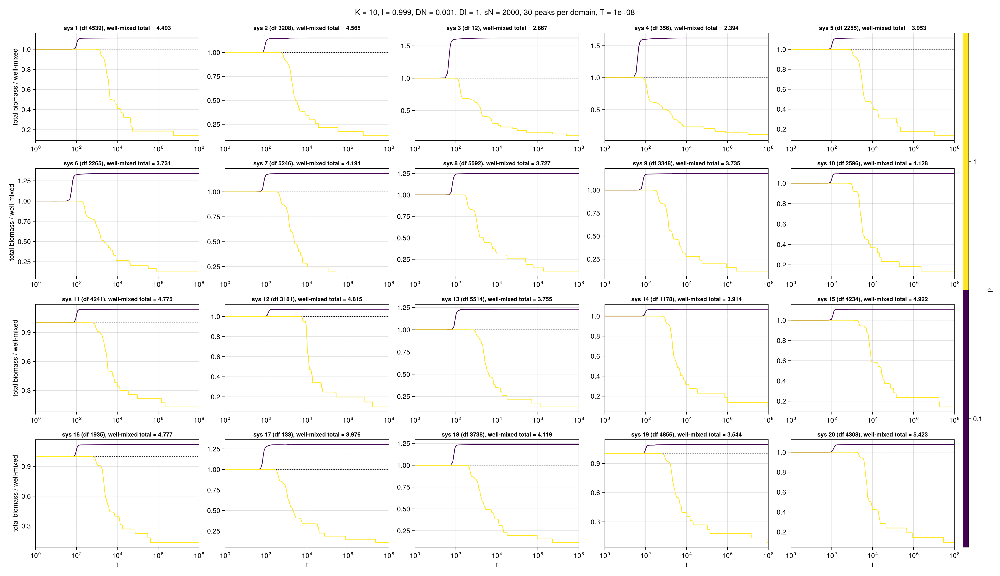

In [10]:
pcolor(r) = pcolors[findfirst(p -> isapprox(p, r.p), pvals)]
pcbar(where) = Colorbar(where; colormap=cgrad(pcolors; categorical=true),
    colorrange=(0.5, np + 0.5), ticks=(1:np, [@sprintf("%.3g", p) for p in pvals]), label="p")

ncols = 5
nrows = cld(nsys, ncols)

fig = Figure(; size=(400 * ncols + 80, 300 * nrows))
Label(fig[0, 1:ncols], suptitle; fontsize=16, tellwidth=false)
for (si, sy) in enumerate(sys)
    i, j = fldmod1(si, ncols)
    rs = runs[runs.gdf_row.==sy, :]
    ax = Axis(fig[i, j]; xscale=log10, titlesize=12,
        title=@sprintf("sys %d (df %d), well-mixed total = %.4g", sy, rs.df_row[1], rs.B_hss[1]),
        xlabel=(i == nrows ? "t" : ""),
        ylabel=(j == 1 ? "total biomass / well-mixed" : ""))
    hlines!(ax, 1.0; color=:black, linestyle=:dash, linewidth=0.8)
    for r in eachrow(rs)
        lines!(ax, r.ts, r.Bmean ./ r.B_hss; color=pcolor(r), linewidth=1.5)
    end
    xlims!(ax, trange...)
end
pcbar(fig[1:nrows, ncols+1])
rowgap!(fig.layout, 16)

Makie.save(joinpath(figdir, "biomass_in_time_rel.pdf"), fig)
fig

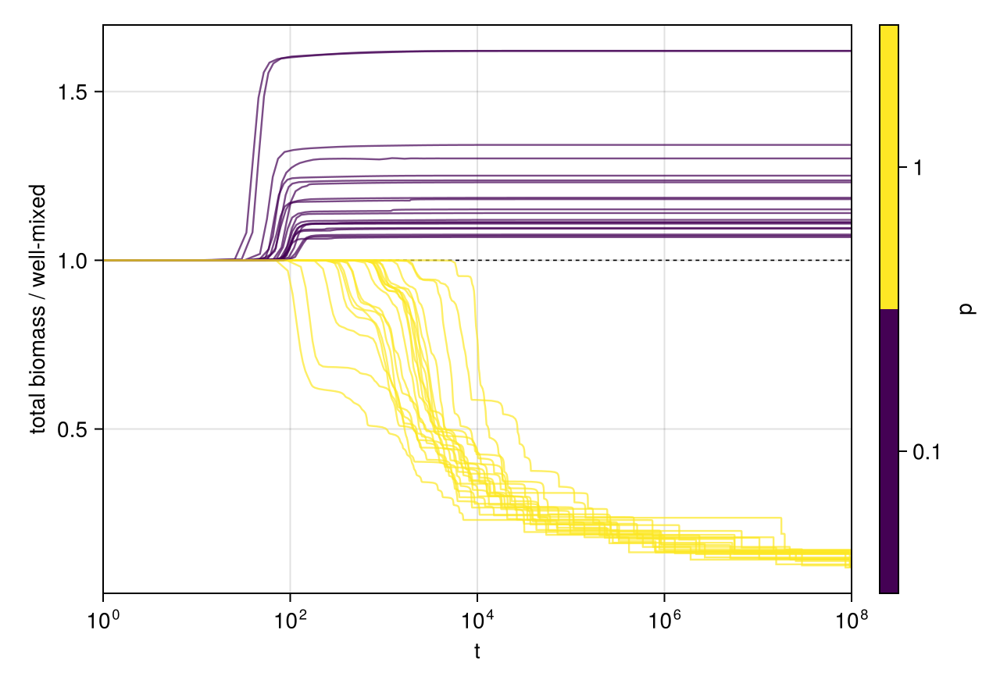

In [11]:
# every run on one axis
fig = Figure(; size=(640, 440))
ax = Axis(fig[1, 1]; xscale=log10, xlabel="t", ylabel="total biomass / well-mixed")
hlines!(ax, 1.0; color=:black, linestyle=:dash, linewidth=0.8)
for r in eachrow(runs)
    lines!(ax, r.ts, r.Bmean ./ r.B_hss; color=(pcolor(r), 0.7), linewidth=1.2)
end
xlims!(ax, trange...)
pcbar(fig[1, 2])

Makie.save(joinpath(figdir, "biomass_in_time_rel_all.pdf"), fig)
fig